# Лабораторная работа №3 «Цифровой спектральный анализ детерминированных сигналов»
Радиофизическая лаборатория 2020-2021 уч. год., понедельник 17:05–20:00
Группы Б01-818, С01-819 ФРКТ МФТИ


In [ ]:
import numpy as np # импорт бибилиотеки numpy
import matplotlib.pyplot as plt # импорт модуля matplotlib.pyplot
from scipy import signal
import scipy.io.wavfile
from scipy import signal


In [ ]:
# Если используете Jupyter, то можно поменять backend
%matplotlib notebook


In [ ]:
%matplotlib inline

# Занятие 1. ДПФ и спектральный анализ.

## Задача 1.1.  Частотная ось ДПФ.

| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** | 'cello1.wav' | 'cello2.wav' | 'glockenspiel.wav' | 'vibraphone1.wav' | 'clarinet.wav' | 'guitar.wav' |

| Варианты: |       7      |     8     |         9        |      10     |        11        |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** | 'cello3.wav' | 'cello4.wav' | 'tuning-fork.wav' | 'vibraphone2.wav' | 'flute.wav' | 'wine-glass.wav' |




Считайте отсчеты дискретного сигнала $x[k]$, содержащегося в аудиофайле Вашего варианта. 

1) Выберите $y[k]$ — часть информативной области сигнала $x[k]$ длиной $2^{14}$ отсчетов. Если в файле меньше $2^{14}$ отсчетов, дополните ее нулями до этого числа отчетов справа.  

2) Постройте с помощью алгоритма БПФ один период ДВПФ сигнала $y[k]$. Укажите расстояние между точками по оси частот. Ось частот приведите в Гц. Определите по графику частоты основных гармонических компонент. 

3) выведите график сигнала $y[k]$ в области, где наблюдается колебание. По графику оцените период этого колебания $T_0$. Сравните частоту $f_0=1/ T_0$ с частотами основных гармоник из п.2.





> 1) $[0.4\cdot10^6 ; \quad 0.4\cdot10^6 + 2^{14}]$

> 2) Из графика $$F_0 \approx 264Hz$$

> 3) $$F_0=278Hz$$



**Справка:**


```
np.fft.fft(...) - получить ДПФ ч/з БПФ
abs(np.fft.fftshift(np.fft.fft(...)) - получить ДВПФ по ДПФ
DTFT() - ДВПФ по x[k]

```



In [ ]:
# init file
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
def DTFT(x, M=None):
    """
    Функция вычисляет значения ДВПФ в M точках на отрезке 
    по оси нормированных частот [-0.5; 0.5]

    Parameters
    ----------
    x : complex
        входная последовательность отсчетов, первый отсчет при k=0
    M : int
        количество точек на отрезке [-0.5; 0.5]

    Returns
    -------
    float
        значения оси нормированных частот, 
        соответствующих вычисленным значениям
        спектральной функции  
    complex
        значения спектральной функции      
    """
    if M is None:
        M=16*x.size
    return (-0.5+(np.arange(M)/M), np.fft.fftshift(np.fft.fft(x, M)))

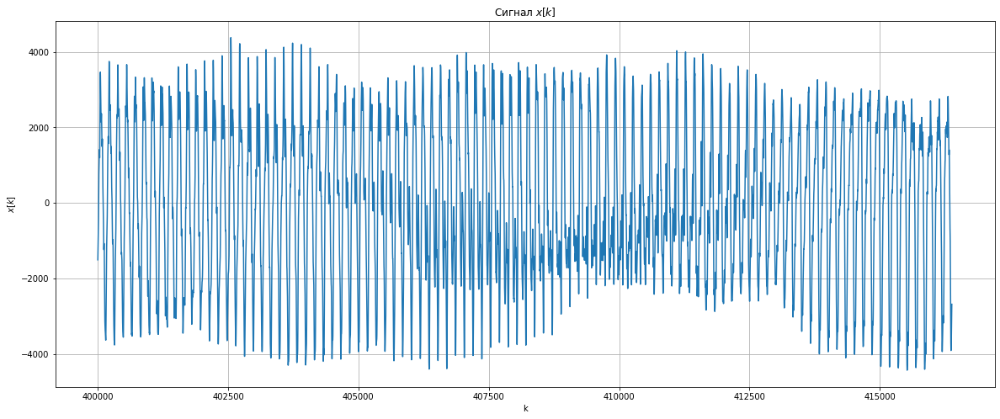

16384


In [ ]:
fs, x = scipy.io.wavfile.read('/content/drive/MyDrive/colaboratory/dataset/cello2.wav')
if len(x.shape)==2:
        x=x[:, 0]

y0 = 400000
dy0 = 2**14
y = x[y0:y0+dy0]

plt.figure(figsize=[20, 8])
plt.plot(np.arange(y.size)+y0, y)
plt.grid()
plt.title("Cигнал $x[k]$")
plt.xlabel("k")
plt.ylabel("$x[k]$")
plt.show()

print(y.size)

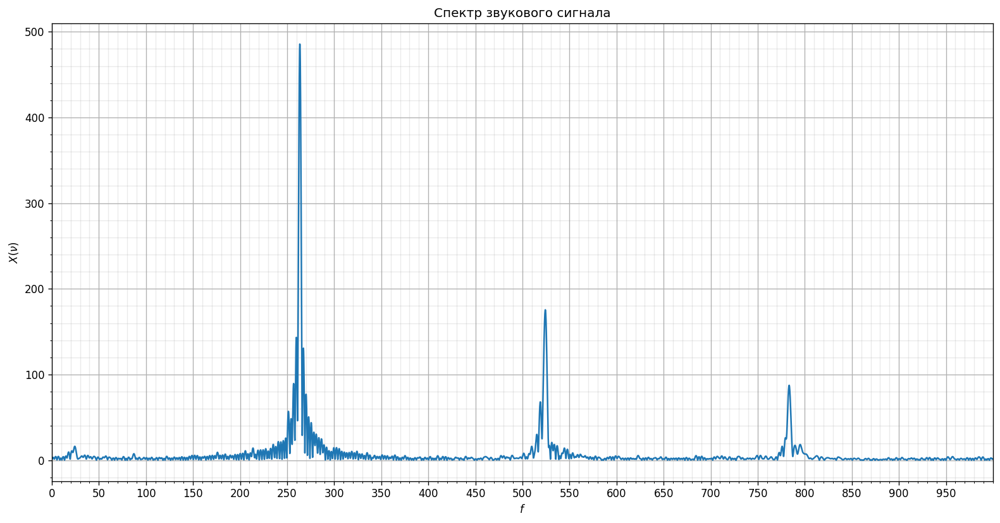

In [ ]:
nu, Xf = DTFT(y)
plt.figure(figsize=[16, 8], dpi=120)
plt.title("Спектр звукового сигнала")
plt.plot(nu*fs, abs(Xf)/fs)
plt.ylabel("$X(\\nu)$")
plt.xlabel("$f$")
plt.xlim([0, 1000])
plt.xticks(np.arange(0, 1000, 50))
plt.grid()
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)

$$f_0=264Hz$$
$$f_1=525Hz$$
$$f_2=784Hz$$

44100


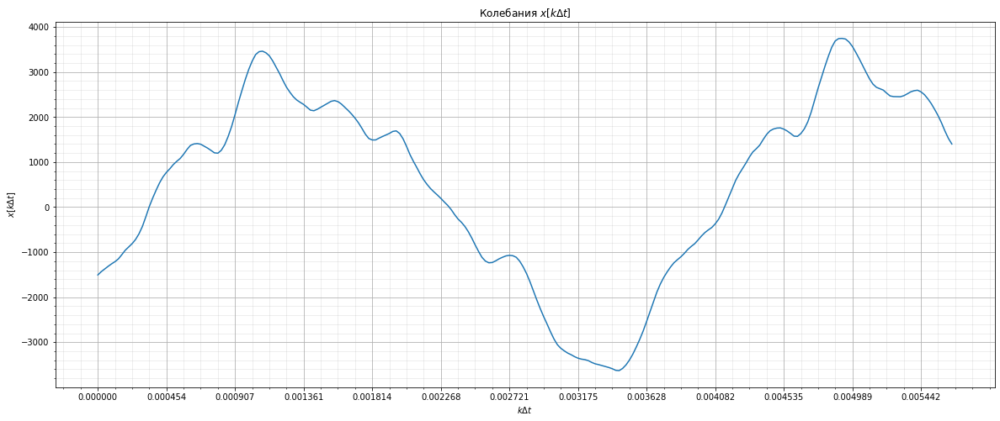

In [ ]:
fd=44100
takt = x[400000:400250]
plt.figure(figsize=[20, 8])
plt.plot(np.arange(takt.size)/fd, takt)
print(fd)
plt.grid()
plt.title("Колебания $x[k\\Delta t]$")
plt.xlabel("$k\\Delta t$")
plt.xticks(np.arange(0,takt.size,20)/fd)
plt.ylabel("$x[k\\Delta t]$")
#plt.xticks(np.arange(0,250,5)/fd)
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
plt.show()

> 3) $$T_0=0.0048-0.0012=0.0036s \Rightarrow F_0 = 278Hz$$

## Задача 1.2. Задача распознавания спектральных компонент. 

Считайте последовательность $x[k]$ из файла Вашего варианта (`variant_Nv_ex_1_2.npy`, где `Nv` — номер варианта). Известно, что ее аналитическая запись  имеет вид 

$$x[k]=\sum\limits_{m=1}^{M}{{{A}_{m}}}\sin (2\pi \frac{m}{N}k+{{\varphi }_{m}}),\quad k=0,\ 1,\ 2,\ \ldots ,\ N-1,$$


где $N$ — длина последовательности, $M<N$ — число гармонических компонент c ненулевой амплитудой, относительные частоты которых совпадают с бинами ДПФ. Определите число компонент $M$,  их амплитуды ${{A}_{m}}$ и фазы ${{\varphi }_{m}}$, $m=1,\dots, M$.


In [ ]:
#init
Nv=2
x = np.load('/content/drive/MyDrive/colaboratory/dataset/variant_%i_ex_1_2.npy' %Nv )

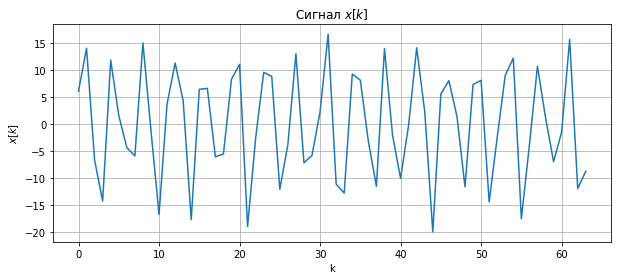

In [ ]:
plt.figure(figsize=[10, 4])
plt.plot(np.arange(x.size), x)
plt.grid()
plt.title("Cигнал $x[k]$")
plt.xlabel("k")
plt.ylabel("$x[k]$")
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


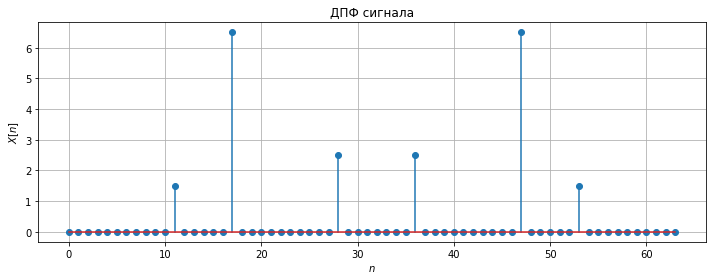

1) module X[11] = 1.500000000000001 angle X[11] =  0.7853981633974401
2) module X[17] = 6.5000000000000036 angle X[17] =  0.5235987755983025
3) module X[28] = 2.500000000000004 angle X[28] =  3.6651914291880923


In [ ]:
Xn=np.fft.fft(x)
N = Xn.size

plt.figure(figsize=[10, 4])
plt.title('ДПФ сигнала')
plt.stem(np.arange(Xn.size), abs(Xn)/N)
plt.ylabel("$X[n]$")
plt.xlabel("$n$")
plt.tight_layout()
plt.grid()
plt.show()

print('1) module X[11] =', np.abs(Xn[11])/N, 'angle X[11] = ', np.angle(Xn[11])+(np.pi/2))
print('2) module X[17] =', np.abs(Xn[17])/N, 'angle X[17] = ', np.angle(Xn[17])+(np.pi/2))
print('3) module X[28] =', np.abs(Xn[28])/N, 'angle X[28] = ', np.angle(Xn[28])+(np.pi/2))

# Занятие 2. Окна в спектральном анализе.

## Задача 2.1. Исследование характеристик различных окон.
Рассмотрите следующие окна для ДПФ длиной в $N=20+2N_v$, где $N_v $ — номер Вашего варианта:

1) прямоугольное (`boxcar`),

2) Бартлетта (`bartlett`),

3) Ханна (`hann`),

4) Хэмминга (`hamming`),

5) Блэкмана (`blackman`),

6) окно с плоской вершиной (`flattop`).

Постройте графики для окон во временной области, амплитудно-частотной характеристики окон в линейном масштабе и в дБ. По графикам для каждого окна оцените следующие параметры:

* ширину $\Delta \nu$ главного лепестка на уровне половинной мощности,

* максимальный уровень боковых лепестков относительно главного в дБ,

* асимптотическую скорость спада боковых лепестков в дБ/октава. 

Составьте таблицу с результатами. 


In [ ]:
#init
Nnu=2
N=20 + 2 * Nnu

#Прямоугольное

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


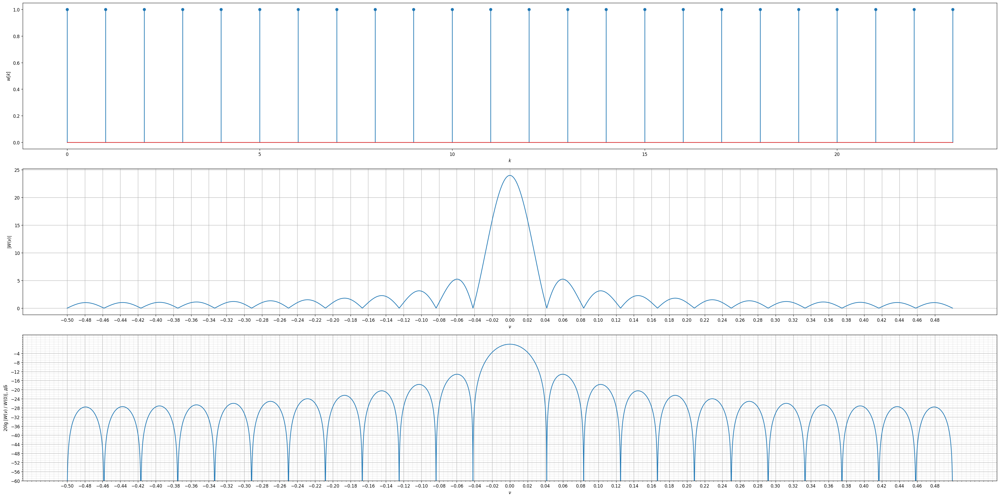

In [ ]:
#boxcar
w=signal.windows.boxcar(M=N, sym=False)

plt.figure(figsize=[32, 16], dpi=120)

plt.subplot(3, 1, 1)
k=np.arange(N)
plt.stem(k, w)
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(3, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()

plt.subplot(3, 1, 3)
k=np.arange(N)
plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))))
plt.ylim(ymin=-60)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-60, 0, 4))
plt.grid()
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)

plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

Основные характеристики прямоугольного окна длиной $N=24$:
*  ширина главного лепестка на нулевом уровне $\Delta \nu = \dfrac{2}{N}=0.083$;
*  полоса по уровню $-3$ дБ составляет $\Delta \nu =\dfrac{0,89}{N}=0.037$;
*  уровень максимального бокового лепестка относительно главного составляет $-13,3$ дБ;
*  скорость спада боковых лепестков $6$ дБ / октава. 

#Барлет

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10


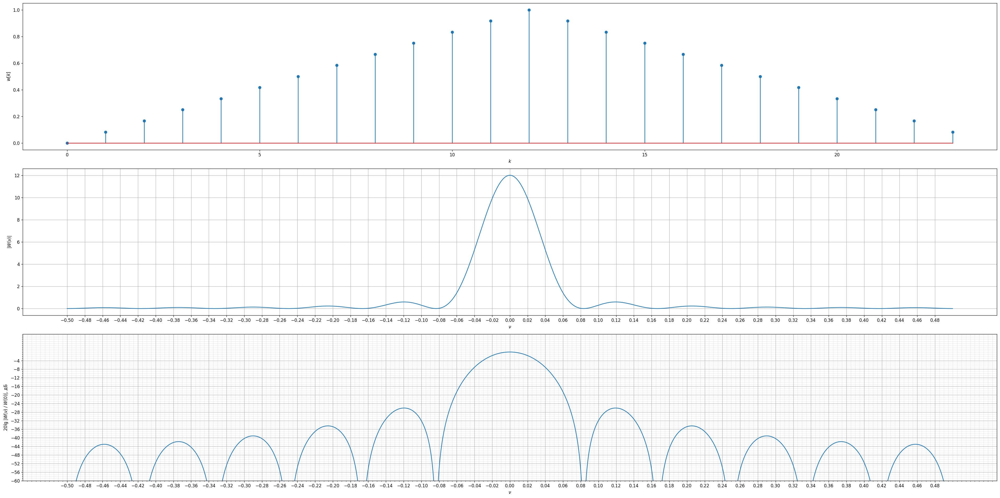

In [ ]:
#barlet
w=signal.windows.bartlett(M=N, sym=False)
plt.figure(figsize=[32, 16], dpi=120)

plt.subplot(3, 1, 1)
k=np.arange(N)
plt.stem(k, w)
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(3, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.grid()

plt.subplot(3, 1, 3)
k=np.arange(N)
plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))))
plt.grid()
plt.ylim(ymin=-60)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-60, 0, 4))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)

plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

Основные характеристики окна Бартлетта длиной $N=24$:
*  ширина главного лепестка на нулевом уровне $\Delta \nu = \dfrac{4}{N}=0.167$;
*  полоса по уровню $-3$ дБ составляет $\Delta \nu =\dfrac{1,28}{N}=0.053$;
*  уровень максимального бокового лепестка относительно главного составляет $-26,5$ дБ;
*  скорость спада боковых лепестков $12$ дБ / октава. 

#Ханн

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


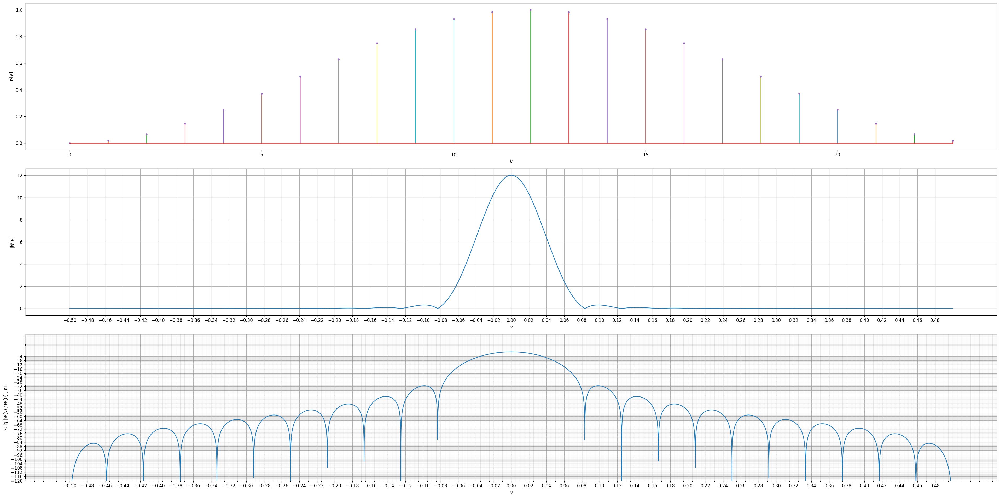

In [ ]:
#hann
w=signal.windows.hann(M=N, sym=False)
plt.figure(figsize=[32, 16], dpi=120)

plt.subplot(3, 1, 1)
k=np.arange(N)
plt.stem(k, w, '-', '.')
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(3, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()

plt.subplot(3, 1, 3)
k=np.arange(N)
plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))))
plt.grid()
plt.ylim(ymin=-120)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-120, 0, 4))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

Основные характеристики окна  Ханна длиной $N=24$:
*  ширина главного лепестка на нулевом уровне $\Delta \nu = \dfrac{4}{N}=0.167$;
*  полоса по уровню $-3$ дБ составляет $\Delta \nu =\dfrac{1,44}{N}=0.06$;
*  уровень максимального бокового лепестка относительно главного составляет $-31,5$ дБ;
*  скорость спада боковых лепестков $24$ дБ / октава. (?)

#Хэмминг

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10


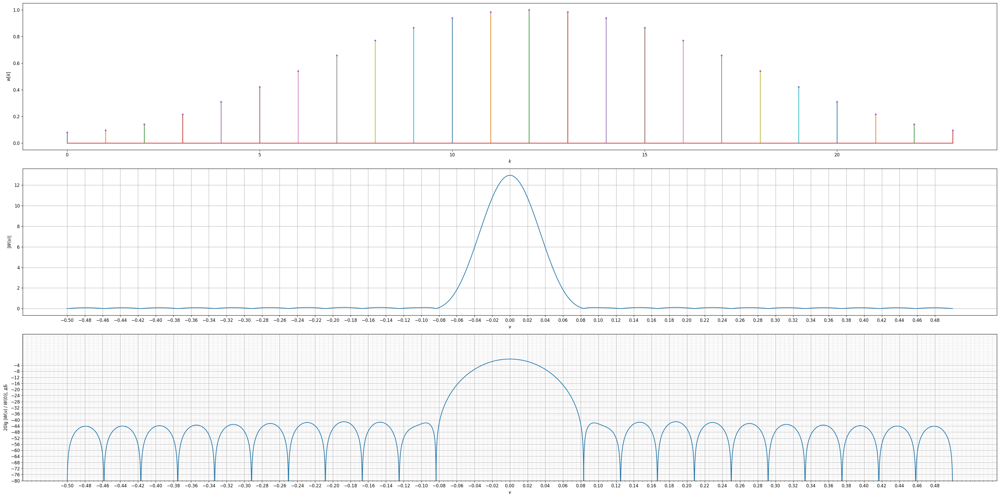

In [ ]:
#hamming
w=signal.windows.hamming(M=N, sym=False)
plt.figure(figsize=[32, 16], dpi=120)

plt.subplot(3, 1, 1)
k=np.arange(N)
plt.stem(k, w, '-', '.')
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(3, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()

plt.subplot(3, 1, 3)
k=np.arange(N)
plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))))
plt.grid()
plt.ylim(ymin=-80)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-80, 0, 4))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

Основные характеристики окна Хэмминга длиной $N=24$:
*  ширина главного лепестка на нулевом уровне $\Delta \nu = \dfrac{4}{N}=0,167$;
*  полоса по уровню $-3$ дБ составляет $\Delta \nu =\dfrac{1,36}{N}=0,057$;
*  уровень максимального бокового лепестка относительно главного составляет $-42$ дБ;
*  скорость спада боковых лепестков $3$ дБ / октава. (?)

#Блэкман

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


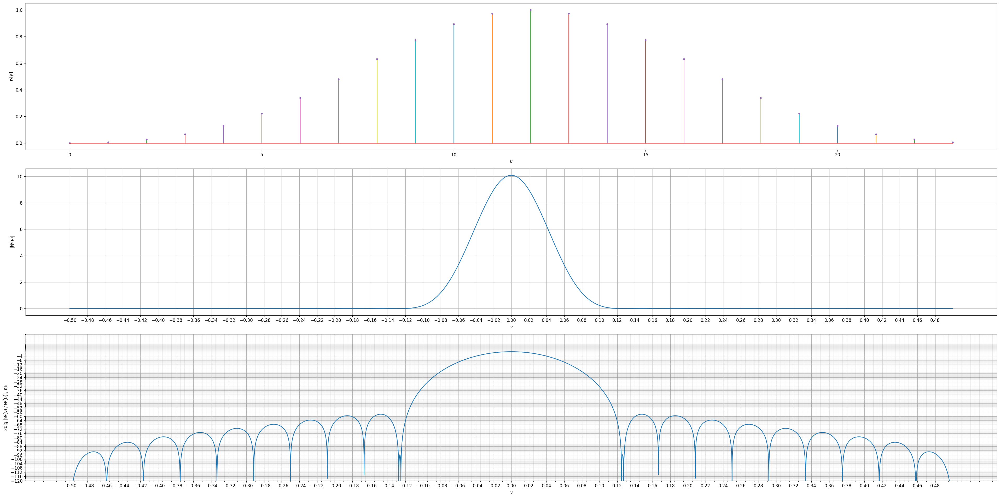

In [ ]:
#blackman
w=signal.windows.blackman(M=N, sym=False)
plt.figure(figsize=[32, 16], dpi=120)

plt.subplot(3, 1, 1)
k=np.arange(N)
plt.stem(k, w, '-', '.')
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(3, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()

plt.subplot(3, 1, 3)
k=np.arange(N)
plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))))
plt.grid()
plt.ylim(ymin=-120)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-120, 0, 4))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

Основные характеристики окна Блэкмана длиной $N=24$:
*  ширина главного лепестка на нулевом уровне $\Delta \nu = \dfrac{6}{N}=0.25$;
*  полоса по уровню $-3$ дБ составляет $\Delta \nu =\dfrac{1.68}{N}=0.07$;
*  уровень максимального бокового лепестка относительно главного составляет $-58$ дБ.
*  скорость спада боковых лепестков 14 дБ / октава. (?)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


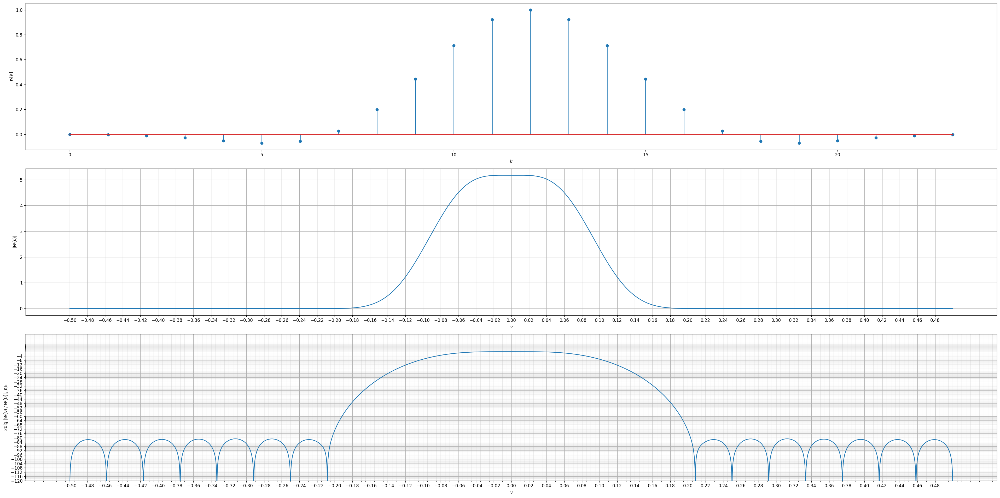

In [ ]:
#flattop
w=signal.windows.flattop(M=N, sym=False)
plt.figure(figsize=[32, 16], dpi=120)

plt.subplot(3, 1, 1)
k=np.arange(N)
plt.stem(k, w)
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(3, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.grid()

plt.subplot(3, 1, 3)
k=np.arange(N)
plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))))
plt.grid()
plt.ylim(ymin=-120)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-120, 0, 4))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)

plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

Основные характеристики окна Блэкмана длиной $N=24$:
*  ширина главного лепестка на нулевом уровне $\Delta \nu = 0.42$;
*  полоса по уровню $-3$ дБ составляет $\Delta \nu =0.15$;
*  уровень максимального бокового лепестка относительно главного составляет $-82$ дБ.
*  скорость спада боковых лепестков 10 дБ / октава. (?)

## Задача 2.2. Окно Кайзера.
Повторите вычисления задачи 2.1 для окна Кайзера с параметром $\beta =0;\ \ 5;\ \ 6;\ \ 8,6$. Сравните полученные результаты с предыдущей задачей. 


In [ ]:
#init
beta_ = 0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


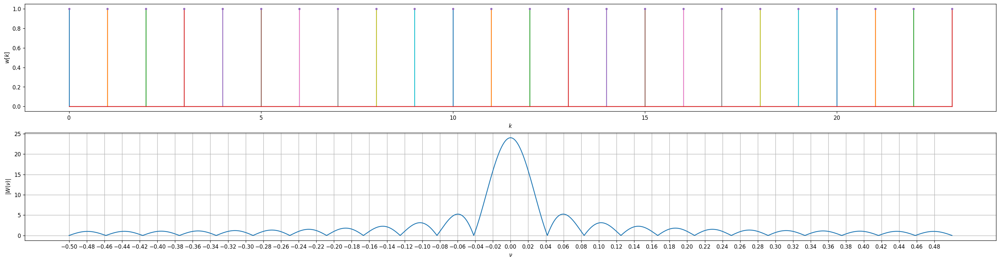

In [ ]:
w=scipy.signal.windows.kaiser(M=N, beta=beta_, sym=False)
plt.figure(figsize=[32, 8], dpi=120)

plt.subplot(2, 1, 1)
k=np.arange(N)
plt.stem(k, w, '-', '.')
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(2, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()

0
5
6
8.6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in log10


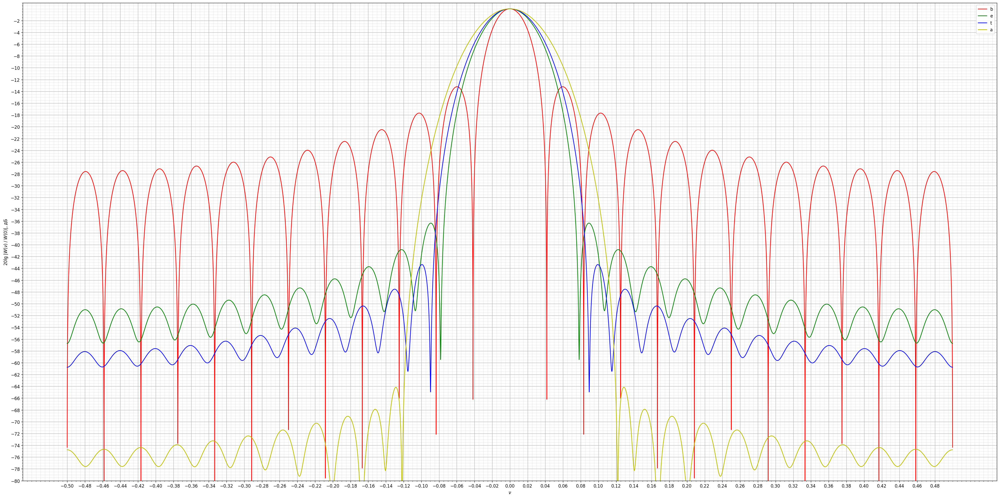

In [ ]:
plt.figure(figsize=[32, 16], dpi=120)
plt.grid()
plt.ylim(ymin=-80)
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-80, 0, 2))
plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

beta_list = [0, 5, 6, 8.6]
clr = ['r','g', 'b', 'y']
for i in range(4):
  print(beta_list[i])
  w=scipy.signal.windows.kaiser(M=N, beta=beta_list[i], sym=False)
  nu, Wn = DTFT(w, M=8*2048)
  plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))), color=clr[i])
  plt.legend('beta = %.2f' % beta_list[i])
plt.show()


Уровни боковых лепестков:
$$\beta=0, \quad A=-13.5dB$$
$$\beta=5, \quad A=-40.55dB$$
$$\beta=6, \quad A=-43.45dB$$
$$\beta=8.6, \quad A=-64.2dB$$

## Задача 2.3. Окно Чебышева.
Получите окно Чебышева для четырех уровней боковых лепестков, которые получились в задаче 2.2. Сравните ширину главного лепестка на уровне половинной мощности с результатами предыдущих задач. 


$$A = -13.5dB, \quad \alpha \approx 9$$
$$A = -43 \div -40 dB, \quad \alpha \approx 48$$
$$A = 64.2 dB, \quad \alpha \approx 72$$

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10


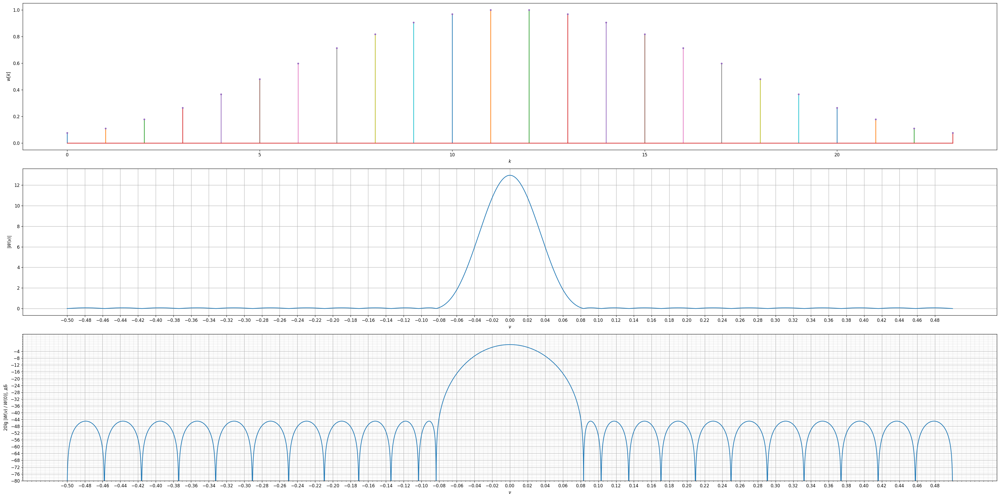

In [ ]:
#chewbin
w=signal.windows.chebwin(M=N, at=45, sym=True)
plt.figure(figsize=[32, 16], dpi=120)

plt.subplot(3, 1, 1)
k=np.arange(N)
plt.stem(k, w, '-', '.')
plt.xlabel('$k$')
plt.ylabel('$w[k]$')

nu, Wn = DTFT(w, M=8*2048)

plt.subplot(3, 1, 2)
k=np.arange(N)
plt.plot(nu, abs(Wn))
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()

plt.subplot(3, 1, 3)
k=np.arange(N)
plt.plot(nu, 20*np.log10(abs(Wn)/max(abs(Wn))))
plt.grid()
plt.ylim(ymin=-80)
plt.xticks(np.arange(nu[0], nu[nu.size-1], 0.02))
plt.yticks(np.arange(-80, 0, 4))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
plt.xlabel('$\\nu$')
plt.ylabel('$20 \lg \; |W(\\nu)\; / \;W(0)|$, дБ')
plt.tight_layout()

## Задача 2.4. Различимость спектральных компонент.

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$n_0$|11 | 15 | 18 | 17 | 32 | 48 | 15 | 18 | 47 | 32 | 40 | 38 |
|$\beta_0$| 1.1| 1.5 | 1.2 | 1.5 | 1.1 | 1.3 | 1.1 | 1.4 | 1.5 | 1.3 | 1.2 | 1.1 |
|$\beta_1$| 5 | 5.5 | 6.2 | 5.7 | 6.1 | 4.9 | 5.1 | 5.7 | 6 | 5.8 | 5.7 | 5.5 |

Произведите спектральный анализ с помощью ДПФ размерности $M=2048$ последовательности 
$$x[k]=\cos\left(2\pi \dfrac{n_0}{128} k\right)+ \cos\left(2\pi \dfrac{n_0+2}{128} k\right)$$
 со взвешиванием следующими оконными функциями длиной 128 отчетов:
 
 а) окном Кайзера с параметром $\beta=\beta_0.$,

 б) окном Кайзера с параметром $\beta=\beta_1.$
 
 в) окном Блэкмана.
 
Значения параметров $n_0$ и $\beta=\beta_1$ определите из таблицы. Ответьте на следующие вопросы.
 
1) Для каких оконных функций гармонические компоненты оказались различимы и почему?

2) Как влияет максимальный уровень боковых лепестков оконной функции на результат спектрального анализа? 


> 1) для а и б (почему: ?)

> 2) чем меньше помехи, т.е. высота боковых лепестков, тем выше разрешение (спектральное)

In [ ]:
#init
N=128
n0=15
beta0 = 1.5
beta1 = 5.5

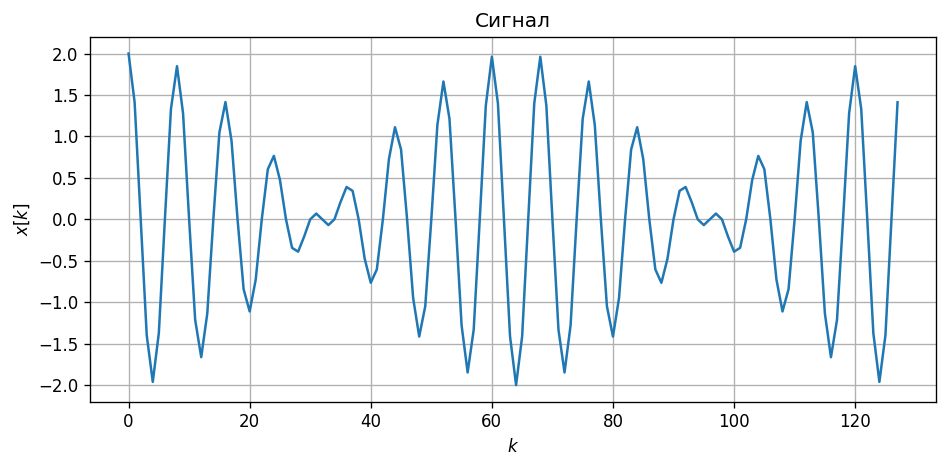

In [ ]:
k=np.arange(N)
x=np.cos(2*np.pi*k*n0/N)+np.cos(2*np.pi*k*(n0+2)/N)
plt.figure(figsize=[8, 4], dpi=120)
plt.title('Сигнал')
plt.plot(k, x)
plt.xlabel('$k$')
plt.ylabel('$x[k]$')
plt.grid()
plt.tight_layout()

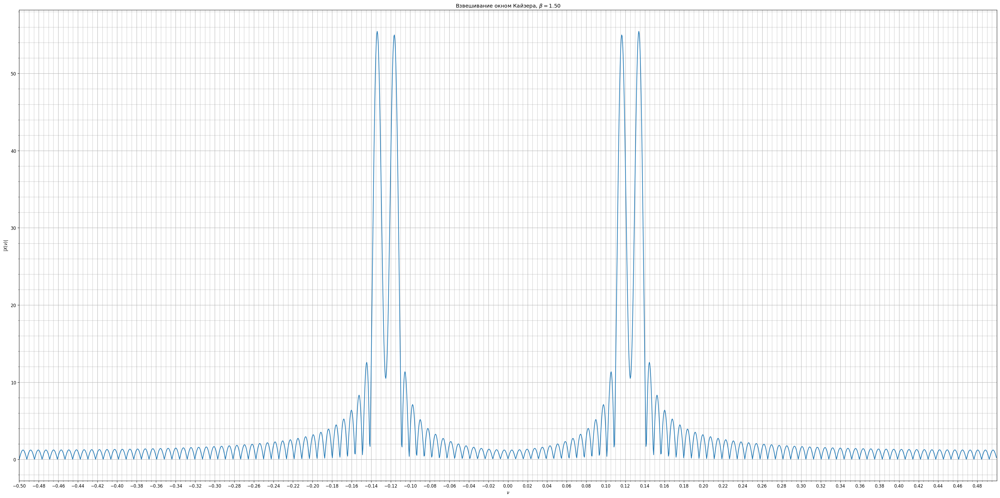

In [ ]:
y=x*signal.windows.kaiser(M=N, beta=beta0, sym=False)
nu, Xn = DTFT(y)

plt.figure(figsize=[32, 16], dpi=120)
plt.title('Взвешивание окном Кайзера, $\\beta=$%.2f' % beta0)
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|X(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.grid()
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)
plt.tight_layout()

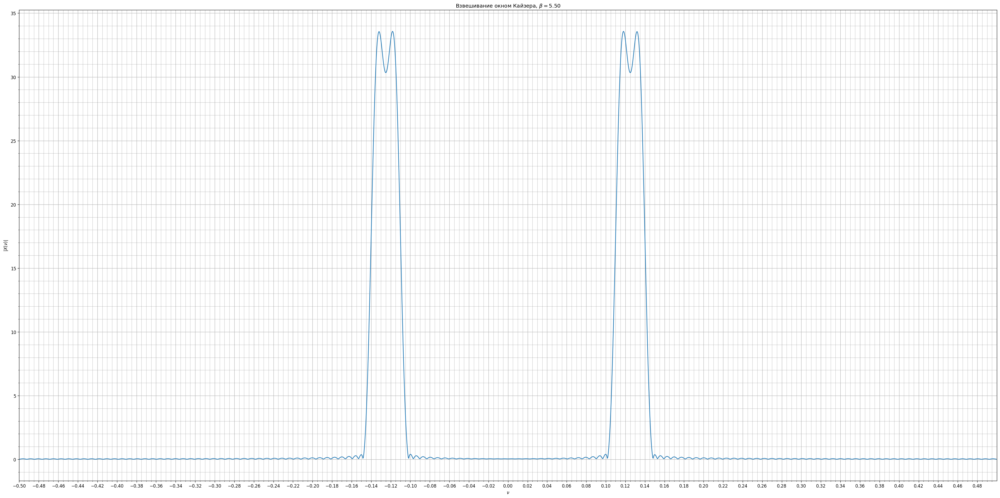

In [ ]:
y=x*signal.windows.kaiser(M=N, beta=beta1, sym=False)
nu, Xn = DTFT(y)

plt.figure(figsize=[32, 16], dpi=120)
plt.title('Взвешивание окном Кайзера, $\\beta=$%.2f' % beta1)
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|X(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.grid()
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)
plt.tight_layout()

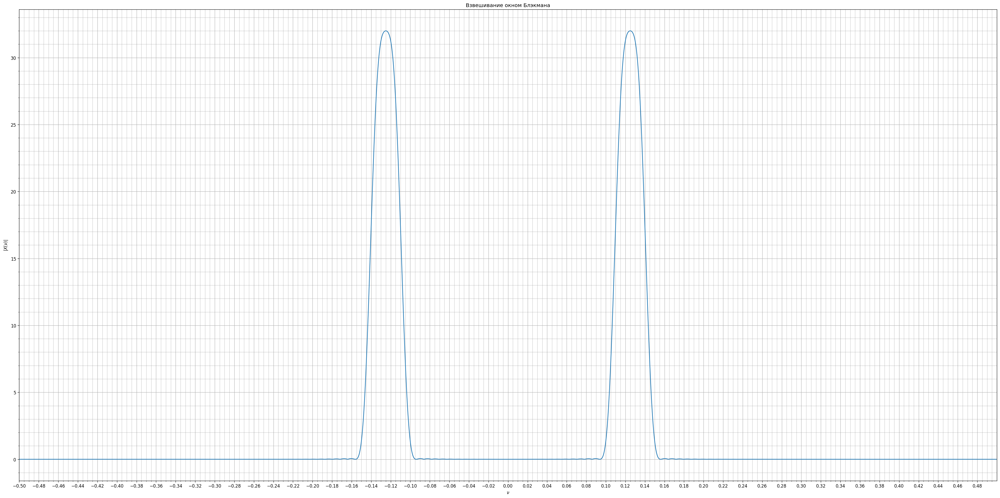

In [ ]:
y=x*signal.windows.blackman(M=N, sym=False)
nu, Xn = DTFT(y)

plt.figure(figsize=[32, 16], dpi=120)
plt.title('Взвешивание окном Блэкмана')
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|X(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.grid()
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)
plt.tight_layout()

## Задача 2.5. Маскировка слабой гармоники боковыми лепестками окна.


| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| $w_1[k]$ | Бартлетта | Ханна | Хэмминга | Ханна | Бартлетта | Хэмминга |
| $m_2$ |    -2     |     2    |   -2    |     2    |   -2    |     2    |
| $m_3$ |     4     |     6    |    3    |     4    |    5    |     7    |


| Варианты: |       7      |     8     |         9        |      10     |        11       |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| $w_1[k]$ | Хэмминга | Ханна | Бартлетта | Ханна | Хэмминга | Бартлетта |
| $m_2$ |      2     |   -2    |     2    |   -2    |     2    |   -2    |
| $m_3$ |      7     |    3    |    -3    |   -4    |     5    |    4    |

Сгенерировать последовательность отсчетов гармонического сигнала $x[k]$ длительностью $N=64$, которая может быть описана следующей формулой:
$$x[k]=a_1 \sin\left(2\pi k \frac{n}{N}\right) + a_2 \cos\left(2\pi k \frac{n+m_2}{N}\right) - a_3\sin\left(2\pi k \frac{n+m_3}{N}\right),$$
где $a_1 = n = n_\text{v}+10$ ($n_\text{v}$ — номер вашего варианта), $a_2 = \dfrac{a_1}{6}$, $a_3 = \dfrac{a_1}{2}$, $m_2$  и  $m_3$  значения из таблицы, соответствующие вашему варианту.

* Построить ДВПФ $x[k]$, применив прямоугольное окно. Сколько гармонических компонент можно выделить?

* Построить ДВПФ $x[k]$, применив окно Блэкмана. Какие гармонические компоненты наблюдаются теперь?

* Построить ДВПФ $x[k]$, используя окно $w_1[k]$ из вашего варианта. Получилось ли пронаблюдать все гармонические компоненты?

* Подобрать коэффиценты для окон Чебышева и Кайзера так, чтобы возможно было наблюдать все гармонические компоненты. Построить соответствующие графики.**

Аналитическая формула теоретически дает 6 спектральных компонент (по паре на каждый синус/косинус)
> В случае прямоугольного окна и окна Хана можно увидеть все 6 компонент, в случае Блэкмана пропала вторая пара компонент (при $a_2$)

In [ ]:
#init
N = 64
m2 = 2
m3 = 6
nv = 2
n = nv + 10
a1 = n
a2 = a1 / 6.
a3 = a1 / 2

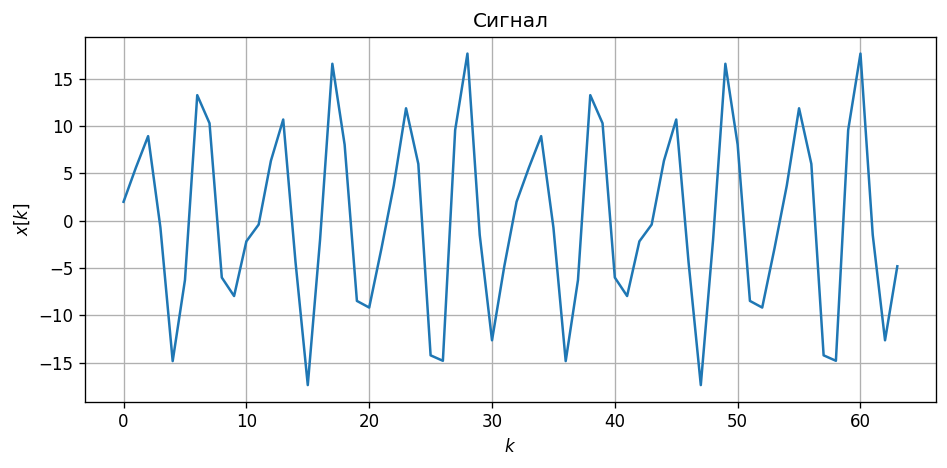

In [ ]:
k=np.arange(N)
x=a1*np.sin(2*np.pi*k*n/N) + a2*np.cos(2*np.pi*k*(n+m2)/N) - a3*np.sin(2*np.pi*k*(n+m3)/N)
plt.figure(figsize=[8, 4], dpi=120)
plt.title('Сигнал')
plt.plot(k, x)
plt.xlabel('$k$')
plt.ylabel('$x[k]$')
plt.grid()
plt.tight_layout()

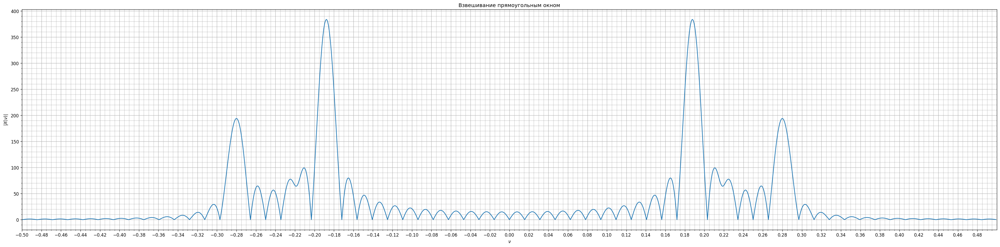

In [ ]:
nu, Xn = DTFT(x)

plt.figure(figsize=[32, 8], dpi=120)
plt.title('Взвешивание прямоугольным окном')
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|X(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.grid()
plt.tight_layout()

plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)

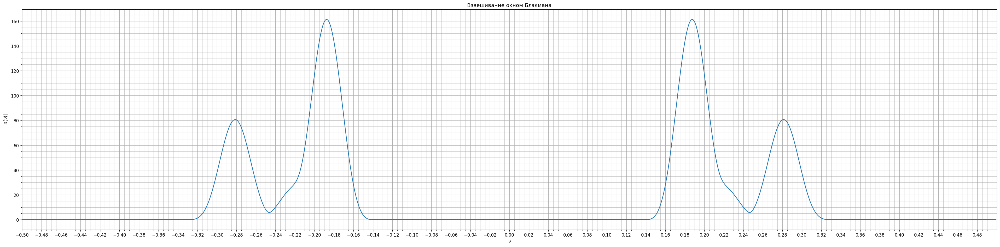

In [ ]:
y=x*signal.windows.blackman(M=N, sym=False)
nu, Xn = DTFT(y)

plt.figure(figsize=[32, 8], dpi=120)
plt.title('Взвешивание окном Блэкмана')
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|X(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.grid()
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)
plt.tight_layout()

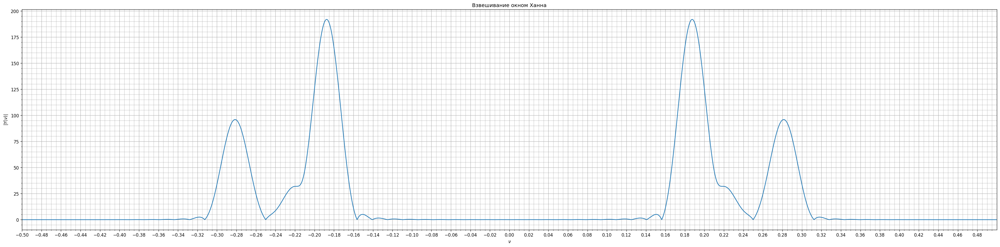

In [ ]:
y=x*signal.windows.hann(M=N, sym=False)
nu, Xn = DTFT(y, M=2048)

plt.figure(figsize=[32, 8], dpi=120)
plt.title('Взвешивание окном Ханна')
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|Y(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.grid()
plt.tight_layout()

plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)
plt.tight_layout()

In [ ]:
#init
koef_cheb = 37
koef_kaiz = 4

/usr/local/lib/python3.7/dist-packages/scipy/signal/windows/windows.py:1439: UserWarning: This window is not suitable for spectral analysis for attenuation values lower than about 45dB because the equivalent noise bandwidth of a Chebyshev window does not grow monotonically with increasing sidelobe attenuation when the attenuation is smaller than about 45 dB.
  warnings.warn("This window is not suitable for spectral analysis "


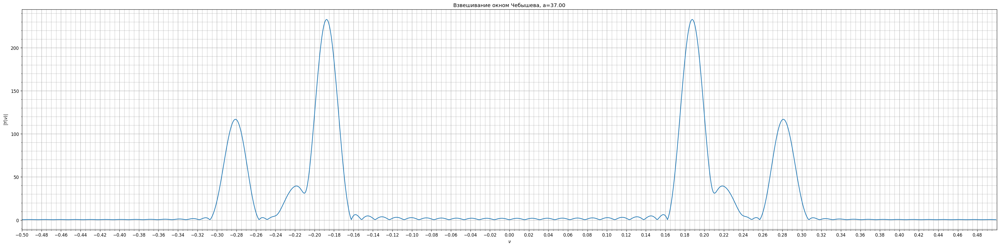

In [ ]:
y=x*signal.windows.chebwin(M=N, at=koef_cheb, sym=False)
nu, Xn = DTFT(y)

plt.figure(figsize=[32, 8], dpi=120)
plt.title('Взвешивание окном Чебышева, a=%.2f' % koef_cheb)
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|Y(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.grid()
plt.tight_layout()

plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)
plt.tight_layout()

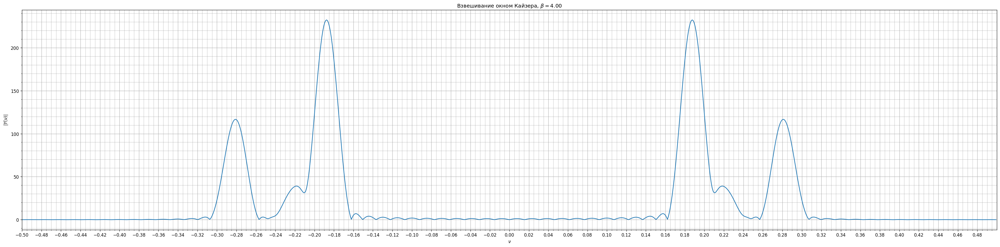

In [ ]:
y=x*signal.windows.kaiser(M=N, beta=koef_kaiz, sym=False)
nu, Xn = DTFT(y)

plt.figure(figsize=[32, 8], dpi=120)
plt.title('Взвешивание окном Кайзера, $\\beta=$%.2f' % koef_kaiz)
plt.plot(nu, abs(Xn))
plt.xlabel('$\\nu$')
plt.ylabel('$|Y(\\nu)|$')
plt.xlim([-0.5, 0.5])
plt.grid()
plt.tight_layout()

plt.xticks(np.arange(-0.5, 0.5, 0.02))
plt.minorticks_on()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)

## Задача 2.6. Амплитудная модуляция спектра.

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$n_0$|11,5 | 15,5 | 18,5 | 17,5 | 32,5 | 48,5 | 15,5 | 18,5 | 47,5 | 32,5 | 40,5 | 38,5 |

Произведите спектральный анализ с помощью ДПФ размерности $M=128$ последовательности 
$$x[k]=\cos\left(2\pi \dfrac{n_0}{128} k\right)$$
 со взвешиванием следующими оконными функциями длиной 128 отчетов:
 
 а) прямоугольным окном (`boxcar`),

 б) окном с плоской вершиной (`flattop`).
 
 
Значение параметра $n_0$ определите из таблицы. Отнормируйте ДПФ на значение АЧХ оконной функции на нулевой частоте ($W(0)=\sum_{k=0}^{N-1} w[k]$). Для двух окон сравните амплитуду гармоники с модулем ближайших к ней отсчетов ДПФ.

In [ ]:
#init
n0=15.5
N=128
k=np.arange(N)
x=np.cos(2*np.pi*n0/N*k)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  if __name__ == '__main__':


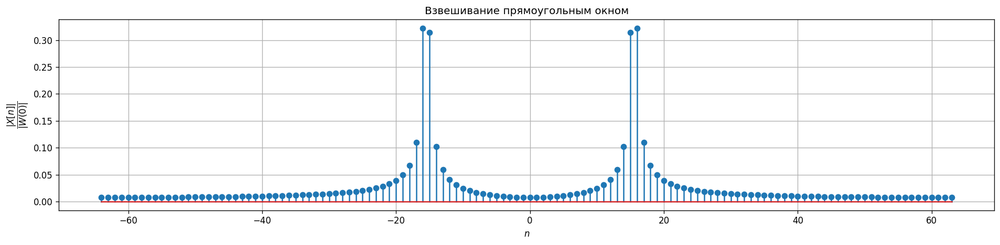

In [ ]:
w=signal.windows.boxcar(x.size, sym=False)
# w=signal.windows.flattop(x.size, sym=False)
y=x*w


Xn=np.fft.fftshift(np.fft.fft(y))

plt.figure(figsize=[16, 4], dpi=120)
plt.stem(np.arange(Xn.size)-N//2, abs(Xn)/sum(w))
plt.xlabel('$n$')
plt.ylabel('$\\dfrac{|X[n]|}{|W(0)|}$')
plt.title('Взвешивание прямоугольным окном')
plt.grid()
plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


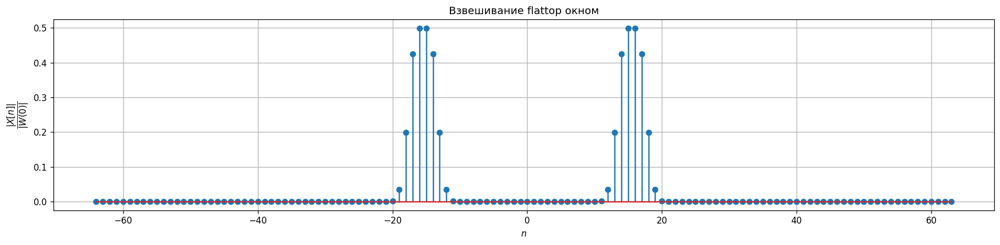

In [ ]:
w=signal.windows.flattop(x.size, sym=False)
y=x*w


Xn=np.fft.fftshift(np.fft.fft(y))

plt.figure(figsize=[16, 4], dpi=120)
plt.stem(np.arange(Xn.size)-N//2, abs(Xn)/sum(w))
plt.xlabel('$n$')
plt.ylabel('$\\dfrac{|X[n]|}{|W(0)|}$')
plt.title('Взвешивание flattop окном')
plt.grid()
plt.tight_layout()

# Занятие 3. Кратковременное дискретное преобразование Фурье (STFT) 

## Задача 3.1. Спектрограмма аудиофайла.  

| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** |'clarinet_minor.wav' | 'clarinet_major32.wav'| 'major_scale_flute1.wav' | 'major_scale_flute2.wav'|'major_scale_flute3.wav' | 'major_scale_flute4.wav'|

| Варианты: |       7      |     8     |         9        |      10     |        11        |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** |'major_scale_flute5.wav'|'major_scale_piano2.wav'|'major_scale_piano3.wav'|'single_notes.wav'|'violin_natural_minor.wav'|'violin_natural_minor_up.wav'|


Вычислите кратковременное дискретное преобразование Фурье (STFT) для отсчетов сигнала, содержащихся в аудиофайле Вашего варианта. Изобразите спектрограмму сигнала. Длину окна (размер кадра), тип оконной функции, число точек в перекрытии, масштабы осей и размерность ДПФ самостоятельно подберите так, чтобы можно было выделить гармонические компоненты в сигнале. Ответьте на следующие вопросы.

1) Какие выводы можно сделать о составе данного сигнала по спектрограмме?  

2) Чему равен размер кадра в секундах и как это соотносится с графиком?

3) Какое разрешение по времени и какое по частоте для данной спектрограммы? 

4) Какие изменения можно наблюдать в спектрограмме, если изменяется:

* а) тип оконной функции,

* б) длина окна,

* в) размерность ДПФ (за счет дополнения нулевыми отсчетами)?


*Прослушав аудиофайл, можно услышать, что звучит гамма F-dur (Фа-мажор): вверх и аналогично вниз.*

**Потому для анализа достаточно рассмотреть только ПОЛОВИНУ аудиозаписи, что и было сделано**

> 1) Тембр включает в себя от 5ти до 11ти компонент, расположенных на кратном расстоянии друг от друга.

> 2) величине, обратной частоте дискретизации в 44100 Гц, длительность графика соответствует длительноти проигрываемой гаммы.

> 3) Порядка 3-х Гц, 0,2 сек (?)

> 4) От оконной функции зависит контраст спектрограммы. Чем больше длина окна В ПРЕДЕЛАХ ДЛИТЕЛЬНОСТИ ОДНОЙ НОТЫ, тем контрастнее, длиннее и уже полосы, размерность ДПФ растет с добавлением нулевых отсчетов.


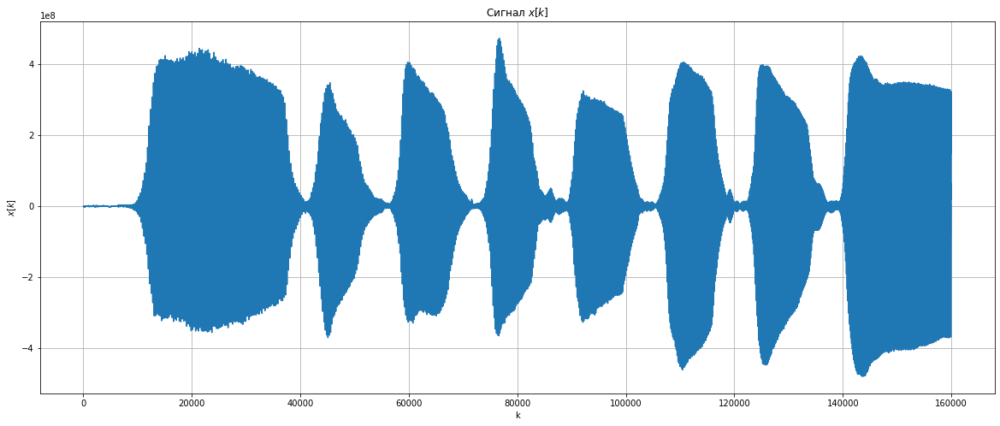

In [ ]:
fs, x = scipy.io.wavfile.read('/content/drive/MyDrive/colaboratory/dataset/clarinet_major32.wav')
if len(x.shape)==2:
        x=x[:, 0]
x = x[:160000]
plt.figure(figsize=[20, 8])
plt.plot(np.arange(x.size), x)
plt.grid()
plt.title("Cигнал $x[k]$")
plt.xlabel("k")
plt.ylabel("$x[k]$")
plt.show()

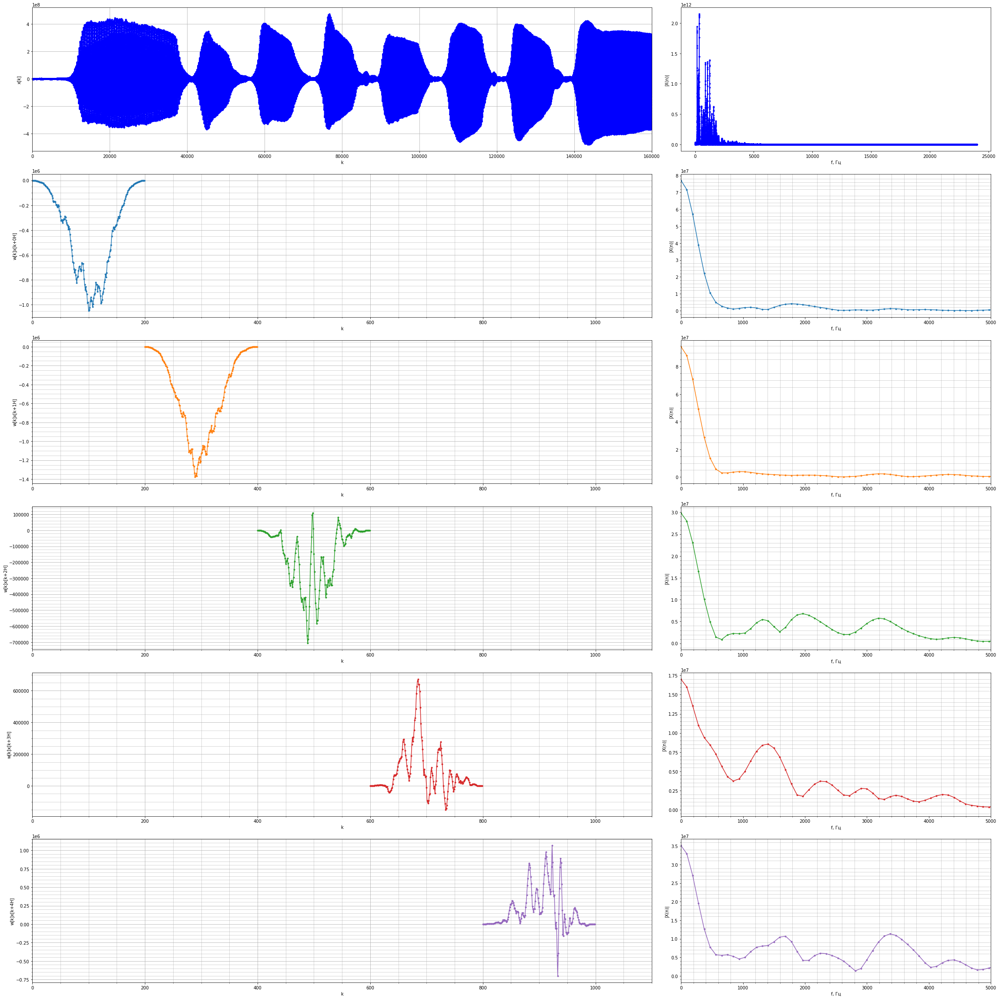

In [ ]:
plt.figure(figsize=[32, 32])
nseg=5
nperseg=200
noverlap=0
from matplotlib import gridspec
gs = gridspec.GridSpec(nseg+1, 2, width_ratios=[2, 1])

plt.subplot(gs[0])
plt.plot(np.arange(x.size), x, '.-b')
plt.xlim([0, x.size])
plt.tight_layout()
plt.grid()
plt.ylabel('x[k]')
plt.xlabel('k')

plt.subplot(gs[1])
X_n=np.fft.fft(x)
plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-b')
plt.ylabel('|X(n)|')
plt.xlabel('f, Гц')

for u in range(nseg):
    plt.subplot(gs[u*2+2])
    y=x[(nperseg-noverlap)*u:(nperseg-noverlap)*u+nperseg]*signal.windows.blackman(nperseg, sym=False)
    plt.plot(np.arange((nperseg-noverlap)*u, (nperseg-noverlap)*u+nperseg), y, '.-C%i' %u)
    plt.xlim([0, 1100])
    
    plt.ylabel('w[k]x[k+%iH]' %u)
    plt.xlabel('k')
    plt.grid()
    plt.tight_layout()
    plt.minorticks_on()
    plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)

    plt.subplot(gs[u*2+3])
    X_n=np.fft.fft(y, 512)
    plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-C%i'  %u)
    plt.ylabel('|X(n)|')
    plt.xlabel('f, Гц')
    plt.xlim([0, 5000])
    plt.tight_layout()

    plt.minorticks_on()
    plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.5)
#     plt.stem(np.arange(nperseg//2)*fs/nperseg, abs(X_n[0:nperseg//2]), 'C%i'  %u, 'C%i.' %u)

In [ ]:
from IPython.display import Audio
Audio('/content/drive/MyDrive/colaboratory/dataset/clarinet_major32.wav')

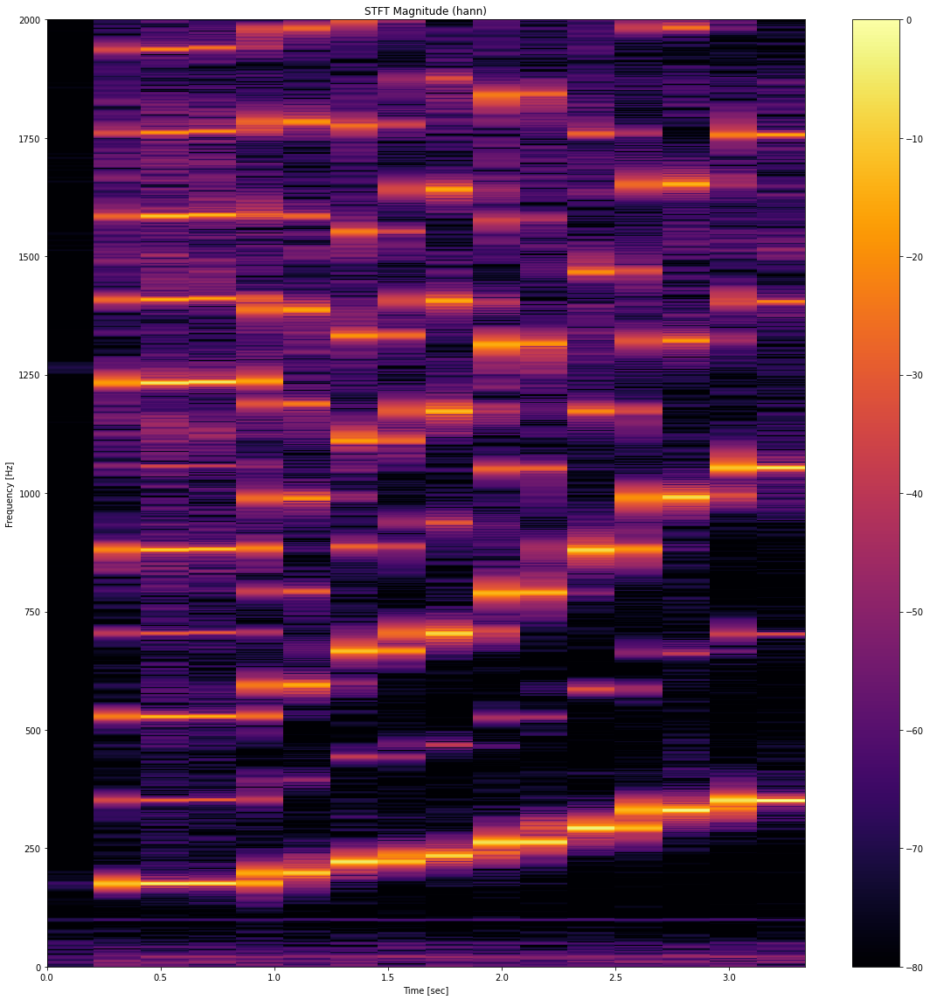

In [ ]:
#f, t, Zxx = signal.stft(x, fs=fs, window=('kaiser', 8), nperseg=20000, noverlap=None, nfft=2**15)
f, t, Zxx = signal.stft(x, fs=fs, window='hann', nperseg=20000, noverlap=None, nfft=2**22)
plt.subplots(figsize=[16, 16])
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx)/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap('inferno'), shading='auto')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT Magnitude (hann)')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.tight_layout()

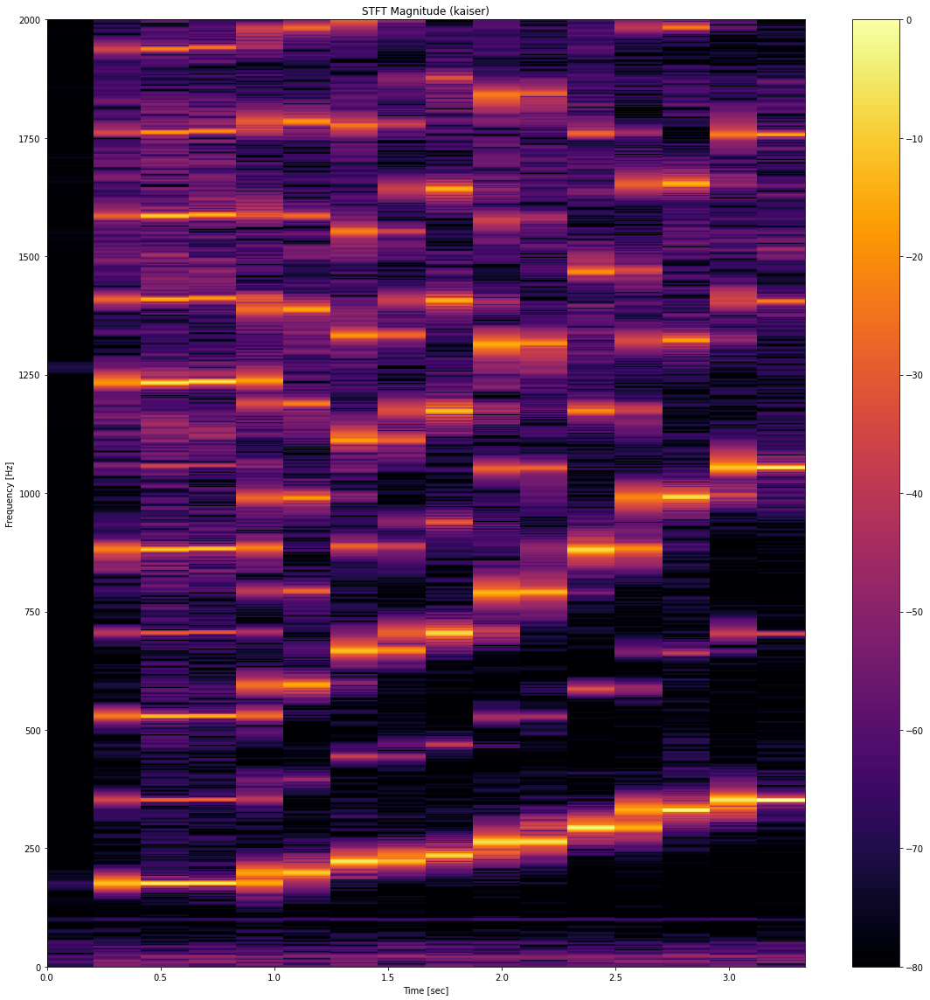

In [ ]:
f, t, Zxx = signal.stft(x, fs=fs, window=('kaiser', 8), nperseg=20000, noverlap=None, nfft=2**15)
#f, t, Zxx = signal.stft(x, fs=fs, window='hann', nperseg=20000, noverlap=None, nfft=2**15)
plt.subplots(figsize=[16, 16])
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx)/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap('inferno'), shading='auto')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT Magnitude (kaiser)')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.tight_layout()

## Задача 3.2. Спектрограмма ЛЧМ сигнала. 

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$f_0$, Гц | 170| 80 | 90 | 75 | 120 | 130 | 85 | 95 | 70 | 65 | 110 | 105 |
|$f_1$, Гц | 800 | 900 | 850 | 870 | 820 | 875 | 780 | 810 | 790 | 825 | 830 | 840 |

Постройте спектрограмму c окном Блэкмана для ЛЧМ-сигнала длительностью $T=2$ секундам, мгновенная частота которого изменяется от $f_0$ до $f_1$, частота дискретизации $f_s=2000$ Гц. Начальный размер кадра (`nperseg`) выберите $H=512$ отсчетов. Пронаблюдайте, как изменяется спектрограмма при изменении следующих параметров:
* тип оконной функции (`window`),
* длина кадра (`nperseg`),
* размерность ДПФ (`nfft`).

> * Тип оконной функции влияет на контраст и разытость спектрограммы, наиболее красивая картина получается для окон Хана, Хэмминга.
* $$L_{nperseg} \leqslant L_{nfft}$$
* Чем больше nfft, тем отчетливее спектрограмма

Рассмотрим сигнал, частота которого изменяется по линейному закону:

$$f(t) = f_0 + (f_1 - f_0) t / t_1$$

In [ ]:
#init
fs=2000
f0=80
f1=900
T=2
H=512

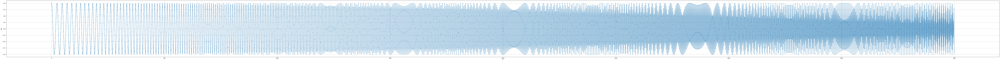

In [ ]:
t=np.arange(0, 2, 1/fs)
x = signal.chirp(t, f0=f0, f1=f1, t1=T, method='linear')

plt.figure(figsize=[128, 8])
#plt.stem(np.arange(x.size), x, '-', '.')
plt.plot(np.arange(x.size), x, '.-')
plt.xlabel('k')
plt.ylabel('x[k]')
plt.tight_layout()
plt.grid()

In [ ]:
print(x.size)

4000


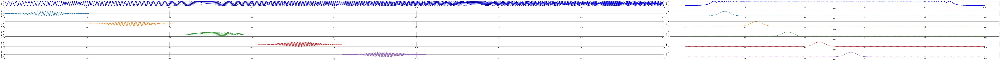

In [ ]:
plt.figure(figsize=[128, 8])
nseg=5
nperseg=H
noverlap=0
from matplotlib import gridspec
gs = gridspec.GridSpec(nseg+1, 2, width_ratios=[2, 1])

plt.subplot(gs[0])
plt.plot(np.arange(x.size), x, '.-b')
plt.xlim([0, x.size])
plt.tight_layout()
plt.grid()
plt.ylabel('x[k]')
plt.xlabel('k')

plt.subplot(gs[1])
X_n=np.fft.fft(x)
plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-b')
plt.ylabel('|X(n)|')
plt.xlabel('f, Гц')

for u in range(nseg):
    plt.subplot(gs[u*2+2])
    y=x[(nperseg-noverlap)*u:(nperseg-noverlap)*u+nperseg]*signal.windows.blackman(nperseg, sym=False)
    plt.plot(np.arange((nperseg-noverlap)*u, (nperseg-noverlap)*u+nperseg), y, '.-C%i' %u)
    plt.xlim([0, x.size])
    
    plt.ylabel('w[k]x[k+%iH]' %u)
    plt.xlabel('k')
    plt.grid()
    plt.tight_layout()
    plt.subplot(gs[u*2+3])
    X_n=np.fft.fft(y, 512)
    plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-C%i'  %u)
    plt.ylabel('|X(n)|')
    plt.xlabel('f, Гц')
    plt.tight_layout()

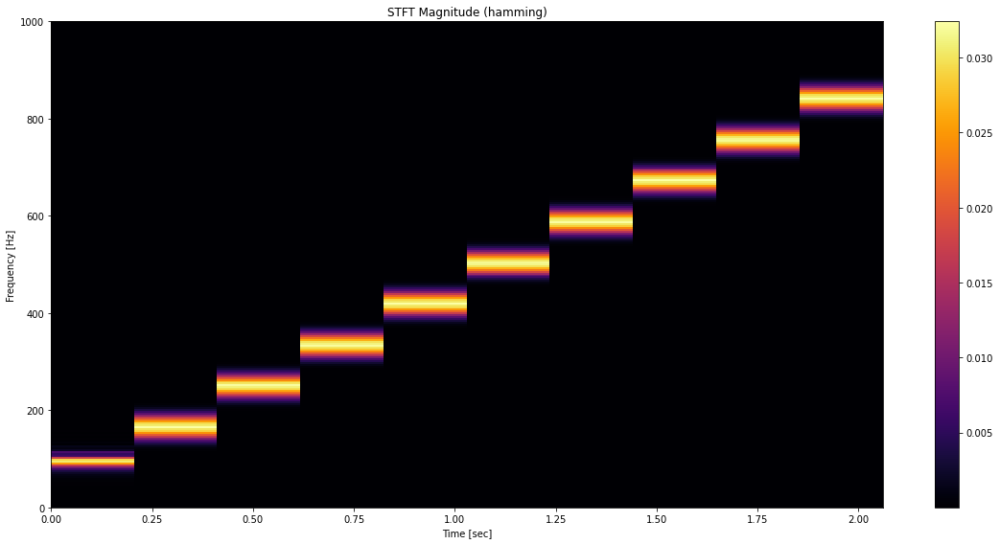

In [ ]:
f, t, Zxx = signal.stft(x, fs=fs, window=('hamming'), nperseg=H, noverlap=100, nfft=H)
plt.figure(figsize=[16, 8])
plt.pcolormesh(t, f, np.abs(Zxx)**2, cmap=plt.get_cmap('inferno'), shading='auto')
plt.colorbar()
plt.title('STFT Magnitude (hamming)')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.tight_layout()
plt.show()

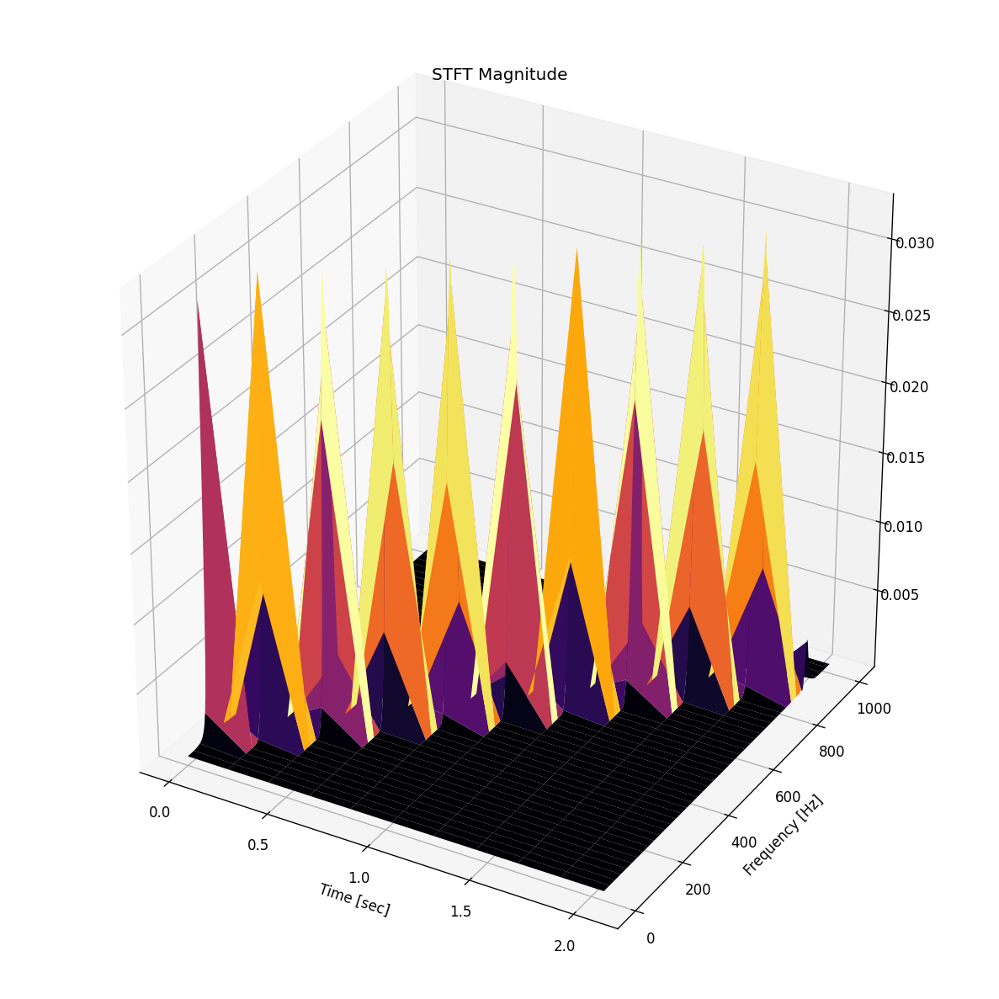

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=[10, 10], dpi=120)
ax = fig.add_subplot(111, projection='3d')
T_, F_ = np.meshgrid(t, f)
ax.plot_surface(T_, F_,  abs(Zxx)**2, cmap=plt.get_cmap('inferno'))
plt.title('STFT Magnitude')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.tight_layout()
plt.show()